# <p style="text-align: center;">Base Model for TP2 - Do you need more signs?</p>

### **1. Import the Required Libraries**

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image # Install Pillow -> conda install anaconda::pillow or pip install pillow
import os
from skimage.io import  imread, imshow # Install scikit-image -> conda install scikit-image or pip install scikit-image
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import re
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.model_selection import train_test_split

### **2. Load the Image Training and Test Datasets**

#### **i. Get the Image Dataset Paths**

In [2]:
train_dataset_path = 'data-students/TRAIN/'
test_dataset_path = 'data-students/TEST'
balanced_dataset_path= 'data-students/TRAIN_balanced'

### ii. Load Image Datasets 

We are going for the tiny version of the dataset!

In [3]:
IMG_WIDTH = 75
IMG_HEIGHT = 75
BATCH_SIZE = 32

Loading the training dataset. Via DataGenerators

In [4]:
transform = transforms.Compose([transforms.Resize((IMG_WIDTH, IMG_HEIGHT)),transforms.ToTensor()])
traffic_signals_dataset = datasets.ImageFolder(root=train_dataset_path, transform=transform)


Split the Training Folder in Training / Validation / Test

In [6]:
# Divisão dos dados em treino, validação e teste (10% para validação, 10% para teste)
train_val_idx, test_idx = train_test_split(
    range(len(traffic_signals_dataset)),
    test_size=0.1,
    shuffle=True,
    stratify=traffic_signals_dataset.targets
)

train_idx, valid_idx = train_test_split(
    train_val_idx,
    test_size=0.1,
    shuffle=True,
    stratify=[traffic_signals_dataset.targets[i] for i in train_val_idx]
)

train_subset = Subset(traffic_signals_dataset, train_idx)
valid_subset = Subset(traffic_signals_dataset, valid_idx)
test_subset = Subset(traffic_signals_dataset, test_idx)

train_dataset_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True)
validation_dataset_loader = DataLoader(valid_subset, batch_size=BATCH_SIZE, shuffle=False)
testtrain_dataset_loader = DataLoader(test_subset, batch_size=BATCH_SIZE, shuffle=False)

In [7]:
training_targets = traffic_signals_dataset.targets
t_targets = {k:0 for k in training_targets}
for t in training_targets:
    t_targets[t] += 1
print('Training class distribution:', t_targets)

Training class distribution: {0: 12, 1: 10, 2: 8, 3: 30, 4: 34, 5: 30, 6: 9, 7: 10, 8: 56, 9: 78}


Loading the test dataset.

In [8]:
class TestDataset(Dataset):
    def get_int(self, text):
        return [int(c) if c.isdigit() else c for c in re.split('(\d+)', text)]
    
    def __init__(self, images_folder, transform=None):
        self.images_folder = images_folder
        self.image_files = [f for f in os.listdir(images_folder) if os.path.isfile(os.path.join(images_folder, f))]
        self.image_files.sort(key=self.get_int)
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.images_folder, self.image_files[idx])
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

inference_dataset = TestDataset(images_folder=test_dataset_path, transform=transform)

test_dataset_loader = DataLoader(inference_dataset, batch_size=BATCH_SIZE, shuffle=False)

#### **iii. Get the Label Mappings**

The labels dictionary is made in order to retrive the class names against the label indices used for training the model

In [9]:
### subset version
#the_labels = {value for _, value in train_datagen.class_to_idx.items()}
labels = {value: key for key, value in traffic_signals_dataset.class_to_idx.items()}
print(labels)
the_real_labels = {}
with open("data-students/labels.csv","r") as label_f:
    for line in label_f.readlines()[1:]:
        label_value, label_description = line.strip().split(";")
        the_real_labels[int(label_value)] = label_description 

print(the_real_labels)

print("Label Mappings for classes present in the training and validation datasets\n")
for key, value in labels.items():
    print(f"{key} : {value} - {the_real_labels[int(value)]}")
the_labels_map = {key: value for key, value in traffic_signals_dataset.class_to_idx.items()}
print(len(labels))

{0: '12', 1: '13', 2: '24', 3: '38', 4: '39', 5: '44', 6: '46', 7: '49', 8: '50', 9: '6'}
{6: 'Speed limit (70km/h)', 12: 'Dont Go Left or Right', 13: 'Dont Go Right', 22: 'Cenas', 24: 'Go Right', 37: 'Children crossing', 38: 'Dangerous curve to the right', 39: 'Dangerous curve to the left', 44: 'Go left or straight', 46: 'Unknown', 49: 'Unk1', 50: 'Fences', 54: 'Do Not Park', 55: 'Do', 57: 'Forbidden'}
Label Mappings for classes present in the training and validation datasets

0 : 12 - Dont Go Left or Right
1 : 13 - Dont Go Right
2 : 24 - Go Right
3 : 38 - Dangerous curve to the right
4 : 39 - Dangerous curve to the left
5 : 44 - Go left or straight
6 : 46 - Unknown
7 : 49 - Unk1
8 : 50 - Fences
9 : 6 - Speed limit (70km/h)
10


In [10]:
# print the number of samples of each class
training_targets = traffic_signals_dataset.targets
t_targets = {k:0 for k in training_targets}

for t in training_targets:
    t_targets[t] += 1
print('Training class distribution:', t_targets)



Training class distribution: {0: 12, 1: 10, 2: 8, 3: 30, 4: 34, 5: 30, 6: 9, 7: 10, 8: 56, 9: 78}


### **2. Plotting Sample Training Images**

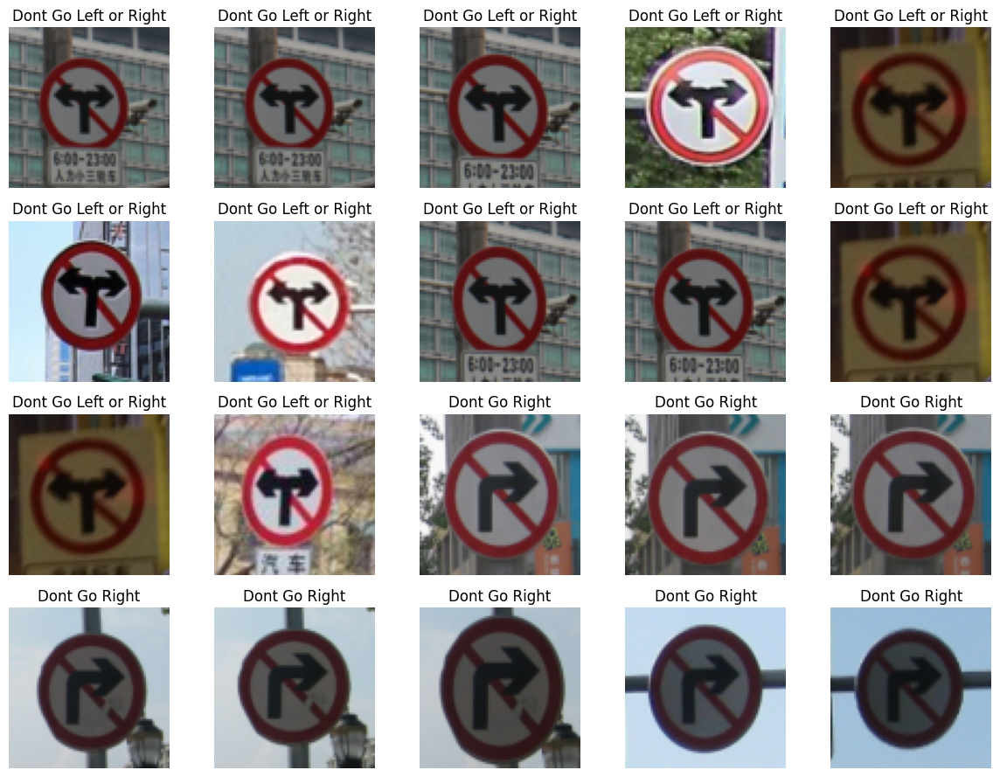

In [12]:
fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(12, 9))
dataiter = iter(traffic_signals_dataset)
idx = 0

for i in range(4):
    for j in range(5):
        images, l = next(dataiter)
        img = images
        label = the_real_labels[int(labels[l])]
        ax[i, j].set_title(f"{label}")
        ax[i, j].imshow(img.permute(1,2,0))
        ax[i, j].axis("off")
        idx += 1

plt.tight_layout()
#plt.suptitle("Sample Training Images", fontsize=21)
plt.show()

In [11]:
class CustomCNN(nn.Module):
    def __init__(self, img_width, img_height, num_classes):
        super(CustomCNN, self).__init__()
        
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=128, kernel_size=5, padding='valid')
        self.bn1 = nn.BatchNorm2d(num_features=128)
        
        self.conv2 = nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding='valid', bias=False)
        self.bn2 = nn.BatchNorm2d(num_features=64)
        
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=32, kernel_size=3, padding='valid', bias=False)
        self.bn3 = nn.BatchNorm2d(num_features=32)
        
        #self.fc1 = nn.Linear(32 * self._conv_output_shape(img_width, img_height), 256)  # Assuming square input for simplification
        self.fc1 = nn.Linear(1568,256)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(256, num_classes)
        
        # L2 regularization is not directly included in layers in PyTorch, 
        # it's typically added to the optimizer during the training step.

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.max_pool2d(x, kernel_size=2)
        
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.max_pool2d(x, kernel_size=2)
        
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.max_pool2d(x, kernel_size=2)
        
        x = torch.flatten(x, 1)  # Flatten all dimensions except batch
        
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        
        return x
    
    def _conv_output_shape(self, img_width, img_height, kernel_size=3, stride=1, padding=0, dilation=1):
        h = ((img_height + (2 * padding) - (dilation * (kernel_size - 1)) - 1) / stride) + 1
        w = ((img_width + (2 * padding) - (dilation * (kernel_size - 1)) - 1) / stride) + 1
        return int(h/8) * int(w/8)  # Considering three max pooling layers with kernel_size=2, stride=2


In [13]:
def train_model(model, criterion, optimizer,train_dataset_loader, num_epochs=10, device='cpu'):
    model.to(device)
    for epoch in range(num_epochs):
        cumulative_loss = 0
        for batch_idx, (data, target) in enumerate(train_dataset_loader):
            data, target = data.to(device), target.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

            #if (batch_idx + 1) % 100 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Step {batch_idx+1}/{len(train_dataset_loader)}, Loss: {loss.item():.4f}')
            cumulative_loss += loss.item()
        print(f"Epoch {epoch+1} average loss: {cumulative_loss/len(train_dataset_loader)}")
    return model.to("cpu")

In [14]:
device = torch.device("cpu")
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():    
    device = torch.device("cuda")

num_classes = len(labels)
print(num_classes)
print(device)
num_epochs = 15
model = CustomCNN(IMG_WIDTH, IMG_HEIGHT, num_classes)
criterion = nn.CrossEntropyLoss()  
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)


10
cpu


In [15]:
TRAIN_MODEL = False
if TRAIN_MODEL:
    ccnn = train_model(model, criterion, optimizer, train_dataset_loader, num_epochs, device)
    
else:
    ccnn = torch.load('baseline_model.pth')

In [16]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

def test_model(model, dataset_loader):
    y_real = []
    y_pred = []
    model.to(device)
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        for images, labels in dataset_loader:
            y_real.extend(labels.numpy())
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            y_pred.extend(predicted.cpu().numpy())
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the {} test images: {} %'.format(total,100 * correct / total))
    # Generate the confusion matrix
    cm = confusion_matrix(y_real, y_pred)
    report_o = classification_report(y_real, y_pred, output_dict=True)
    # Display the confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot()
    plt.show()

    precisions_original = []
    recalls_original = []
    for i in range(num_classes):
        precisions_original.append(report_o[str(i)]['precision'])
        recalls_original.append(report_o[str(i)]['recall'])

    return precisions_original, recalls_original

In [ ]:
print(test_model(ccnn, validation_dataset_loader))

Accuracy of the model on the 28 test images: 78.57142857142857 %


C:\Users\alice\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\alice\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\alice\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result)

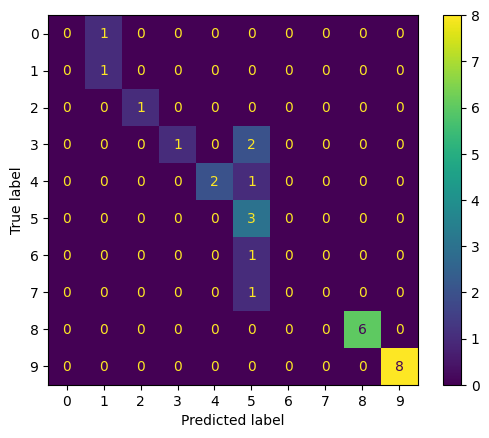

In [18]:
precisions_original, recalls_original = test_model(ccnn, testtrain_dataset_loader)

# AutoEncoder

# Segunda Tentativa - VAE

Treinar VAE para cada classe

Training VAE for class: 24
Epoch 1, Train Loss: 12532.97109375, Valid Loss: 12056.87890625
Model saved for class 24 with validation loss: 12056.87890625
Epoch 2, Train Loss: 12925.90546875, Valid Loss: 12047.75390625
Model saved for class 24 with validation loss: 12047.75390625
Epoch 3, Train Loss: 12121.009375, Valid Loss: 12012.192708333334
Model saved for class 24 with validation loss: 12012.192708333334
Epoch 4, Train Loss: 11837.51171875, Valid Loss: 11959.2890625
Model saved for class 24 with validation loss: 11959.2890625
Epoch 5, Train Loss: 11598.75546875, Valid Loss: 11874.58984375
Model saved for class 24 with validation loss: 11874.58984375
Epoch 6, Train Loss: 11369.91953125, Valid Loss: 11778.540364583334
Model saved for class 24 with validation loss: 11778.540364583334
Epoch 7, Train Loss: 11161.41484375, Valid Loss: 11622.251302083334
Model saved for class 24 with validation loss: 11622.251302083334
Epoch 8, Train Loss: 10972.675, Valid Loss: 11476.436197916666
Model sa

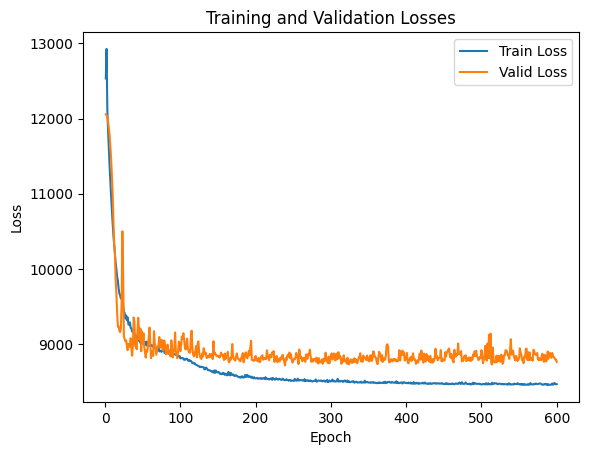

In [114]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision.utils import save_image, make_grid

train_dataset_path = 'data-students/TRAIN/'
test_dataset_path = 'data-students/TEST/'
IMG_WIDTH = 75
IMG_HEIGHT = 75
BATCH_SIZE = 32
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.Resize((IMG_WIDTH, IMG_HEIGHT)),
    transforms.ToTensor()
])

traffic_signals_dataset = datasets.ImageFolder(root=train_dataset_path, transform=transform)

class VAE(nn.Module):
    def __init__(self, img_channels=3, img_size=75, latent_dim=64, num_classes=len(traffic_signals_dataset.classes)):
        super(VAE, self).__init__()
        self.img_size = img_size // 8  # Resulting size after 3 stride-2 conv layers
        self.num_classes = num_classes
        self.encoder = nn.Sequential(
            nn.Conv2d(img_channels, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(128 * self.img_size * self.img_size, latent_dim)
        self.fc_logvar = nn.Linear(128 * self.img_size * self.img_size, latent_dim)
        self.fc_decode = nn.Linear(latent_dim + num_classes, 128 * self.img_size * self.img_size)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.ConvTranspose2d(32, img_channels, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid(),
            nn.Upsample(size=(img_size, img_size))  
        )

    def encode(self, x):
        h = self.encoder(x)
        h = h.view(h.size(0), -1)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z, labels):
        z = torch.cat([z, labels], dim=1)
        h = self.fc_decode(z)
        h = h.view(h.size(0), 128, self.img_size, self.img_size)
        return self.decoder(h)

    def forward(self, x, labels):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z, labels), mu, logvar

def loss_function(recon_x, x, mu, logvar):
    BCE = F.binary_cross_entropy(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return BCE + KLD

vae = VAE(img_channels=3, img_size=IMG_WIDTH, latent_dim=64).to(device)
# experimentat com lr = 1e-3 e lr = 1e-4- para classe 24
optimizer = optim.Adam(vae.parameters(), lr=1e-3)

#600 para classe 24
num_epochs = 800

def train_vae_for_class(class_idx, class_name):
    class_indices = [idx for idx, (_, label) in enumerate(traffic_signals_dataset) if label == class_idx]
    if not class_indices:
        print(f"No images found for class {class_name}")
        return

    train_indices, valid_indices = train_test_split(class_indices, test_size=0.3, shuffle=True)
    train_subset = Subset(traffic_signals_dataset, train_indices)
    valid_subset = Subset(traffic_signals_dataset, valid_indices)

    train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True)
    valid_loader = DataLoader(valid_subset, batch_size=BATCH_SIZE, shuffle=False)

    class_onehot = torch.eye(len(traffic_signals_dataset.classes))[class_idx].to(device)

    best_valid_loss = float('inf')
    train_losses = []
    valid_losses = []
 
    for epoch in range(num_epochs):
        vae.train()
        train_loss = 0
        for data, _ in train_loader:
            data = data.to(device)
            labels = class_onehot.repeat(data.size(0), 1).to(device)
            optimizer.zero_grad()
            recon_batch, mu, logvar = vae(data, labels)
            loss = loss_function(recon_batch, data, mu, logvar)
            loss.backward()
            train_loss += loss.item()
            optimizer.step()

        vae.eval()
        valid_loss = 0
        with torch.no_grad():
            for data, _ in valid_loader:
                data = data.to(device)
                labels = class_onehot.repeat(data.size(0), 1).to(device)
                recon_batch, mu, logvar = vae(data, labels)
                valid_loss += loss_function(recon_batch, data, mu, logvar).item()

        train_loss /= len(train_loader.dataset)
        train_losses.append(train_loss)
        valid_loss /= len(valid_loader.dataset)
        valid_losses.append(valid_loss)
        print(f'Epoch {epoch+1}, Train Loss: {train_loss}, Valid Loss: {valid_loss}')

        # Save the model if validation loss has improved
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            torch.save(vae.state_dict(), f'vae_best_{class_name}.pt')
            print(f'Model saved for class {class_name} with validation loss: {valid_loss}')
            
    # Plot the training and validation losses
    plt.figure()
    plt.plot(range(1, num_epochs + 1), train_losses, label='Train Loss')
    plt.plot(range(1, num_epochs + 1), valid_losses, label='Valid Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Losses')
    plt.legend()
    plt.show()

class_idx = 2  
class_name = traffic_signals_dataset.classes[class_idx]
print(f"Training VAE for class: {class_name}")
train_vae_for_class(class_idx, class_name)


Gerar imagens

# Gerar e guardar imagens de acordo com o SSIM

Generating images for class: 12
Generated 150 images and saved 80 best images for class 12


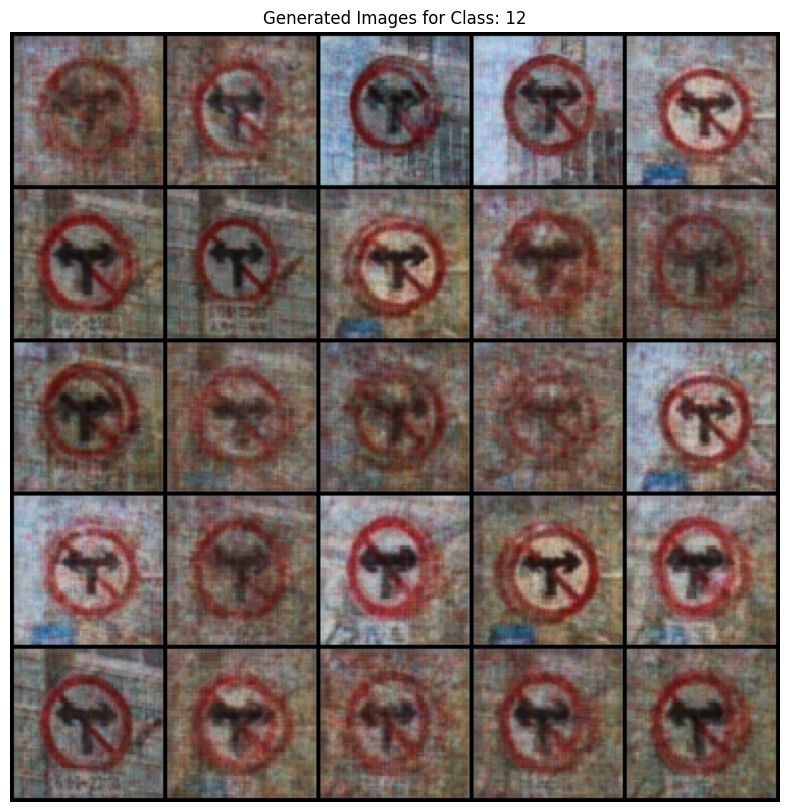

Saved 80 best images for class 12
Generating images for class: 13
Generated 150 images and saved 80 best images for class 13


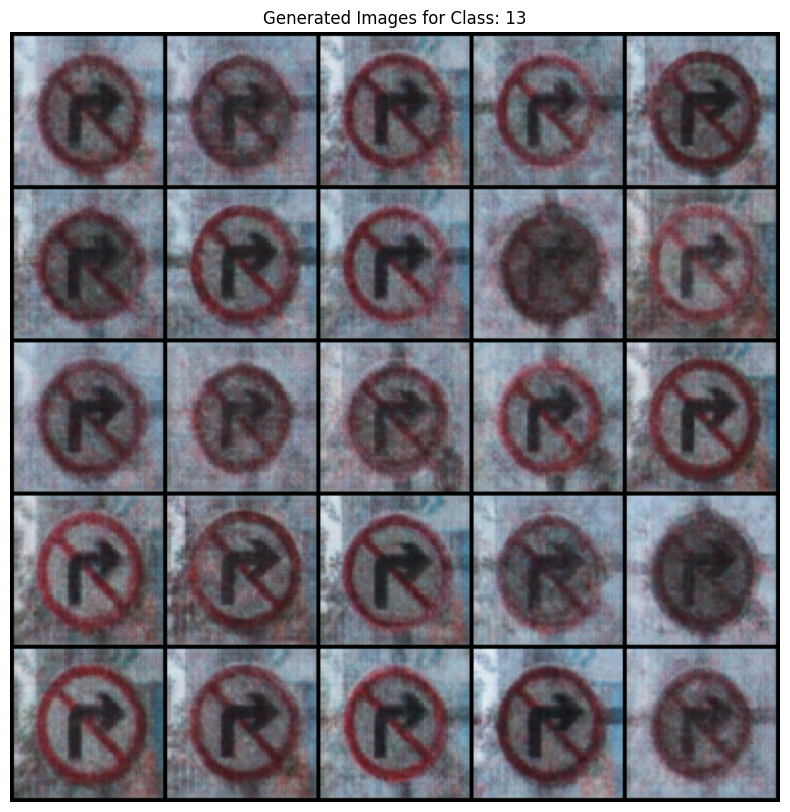

Saved 80 best images for class 13
Generating images for class: 24
Generated 150 images and saved 80 best images for class 24


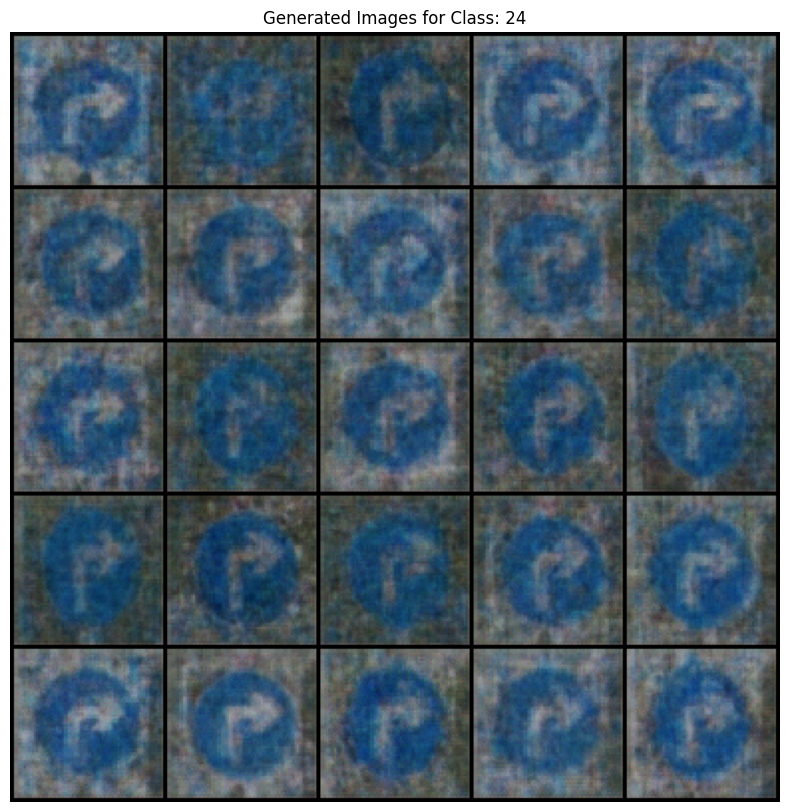

Saved 80 best images for class 24
Generating images for class: 38
Generated 150 images and saved 80 best images for class 38


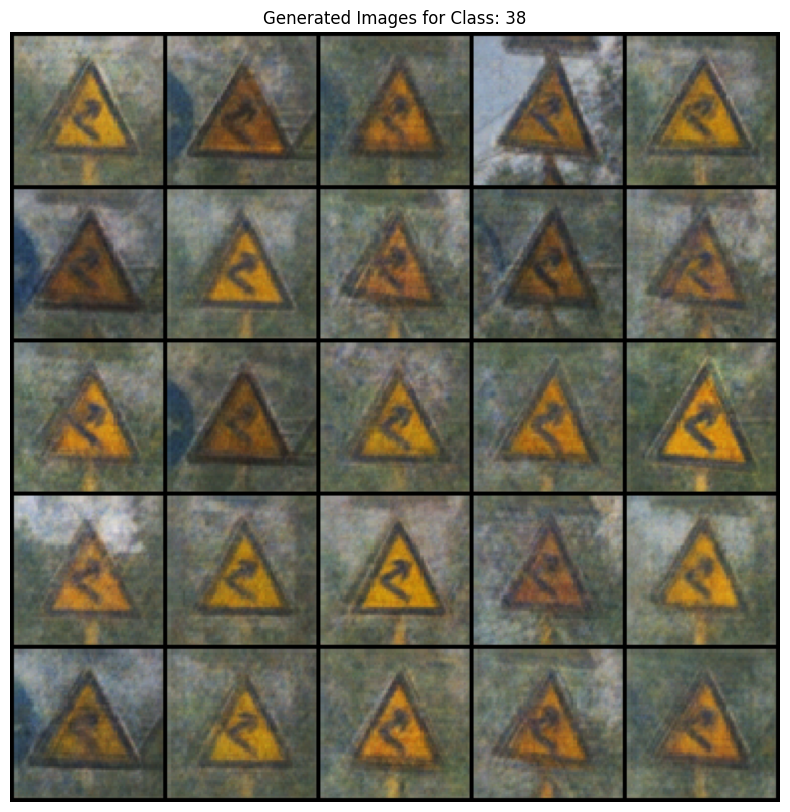

Saved 80 best images for class 38
Generating images for class: 39
Generated 150 images and saved 80 best images for class 39


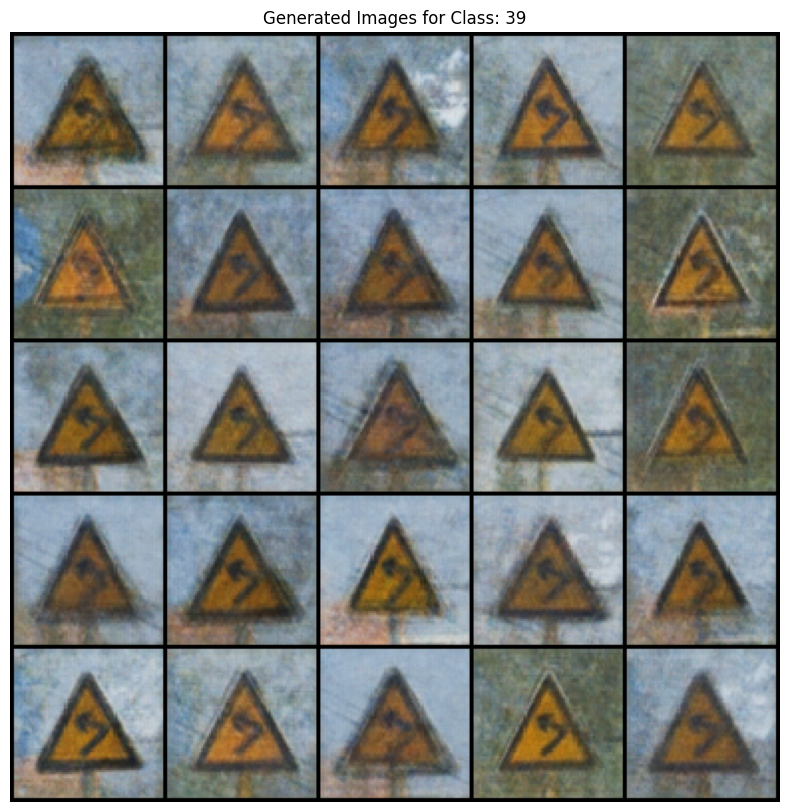

Saved 80 best images for class 39
Generating images for class: 44
Generated 150 images and saved 80 best images for class 44


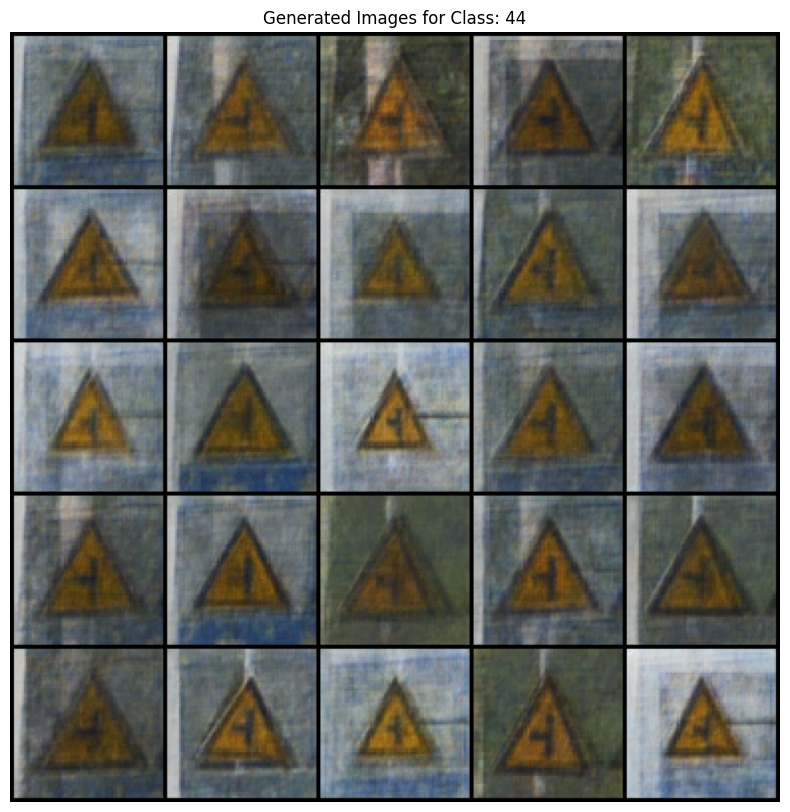

Saved 80 best images for class 44
Generating images for class: 46
Generated 150 images and saved 80 best images for class 46


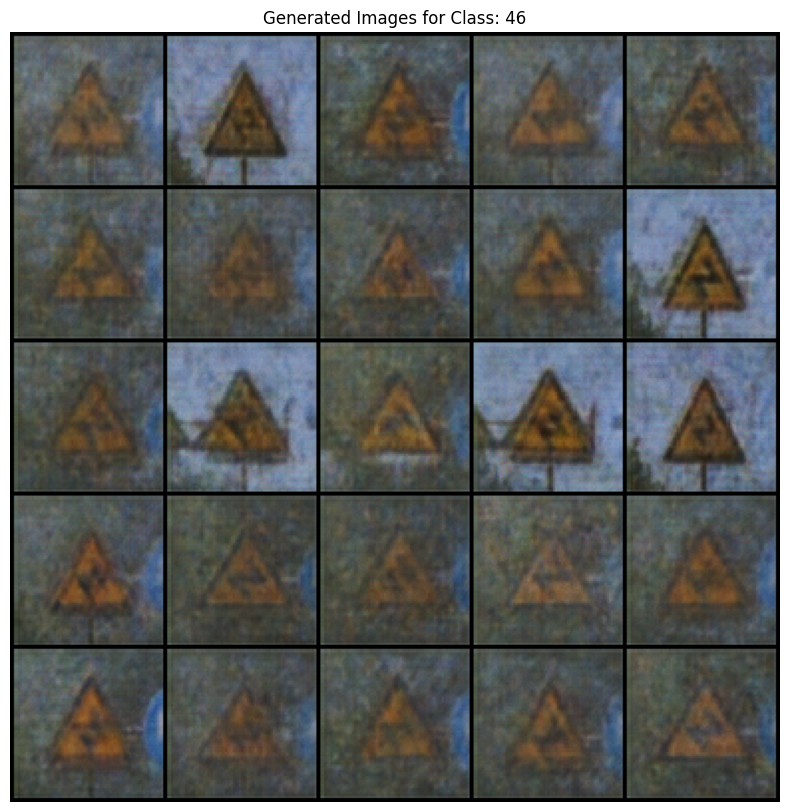

Saved 80 best images for class 46
Generating images for class: 49
Generated 150 images and saved 80 best images for class 49


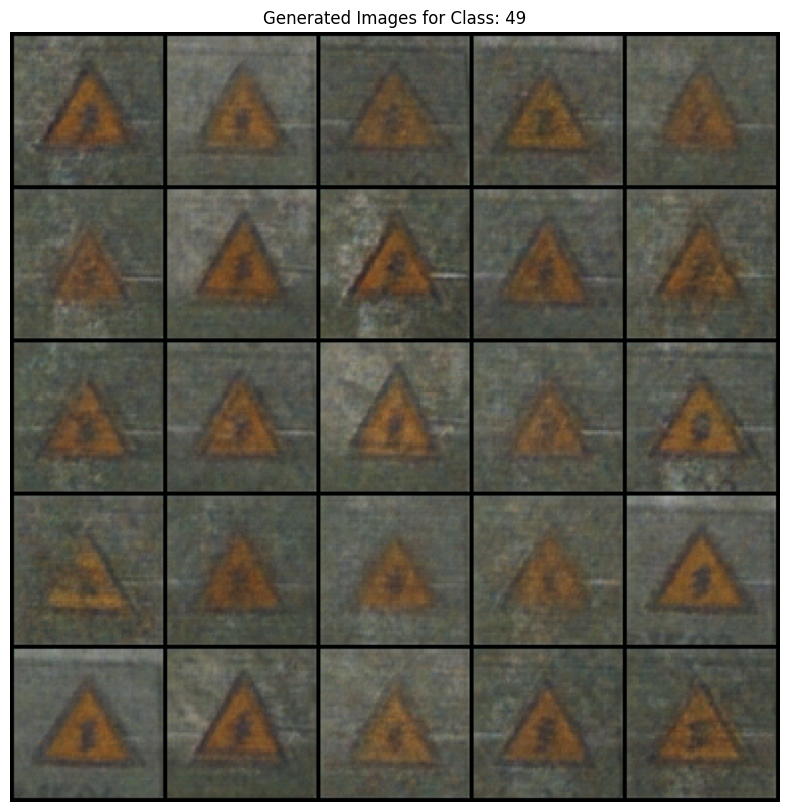

Saved 80 best images for class 49
Generating images for class: 50
Generated 150 images and saved 80 best images for class 50


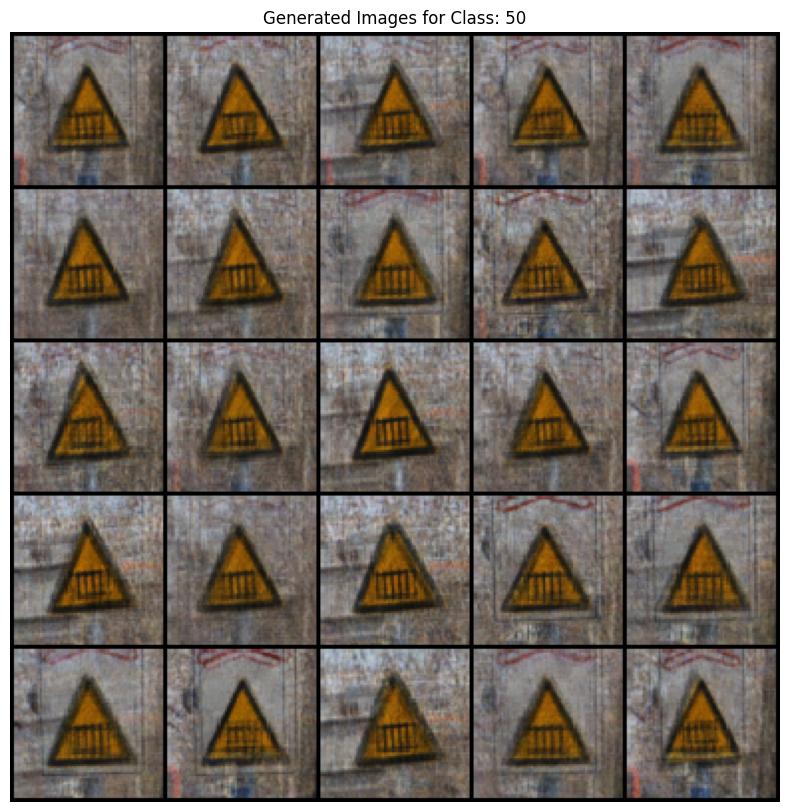

Saved 80 best images for class 50
Generating images for class: 6
Generated 150 images and saved 80 best images for class 6


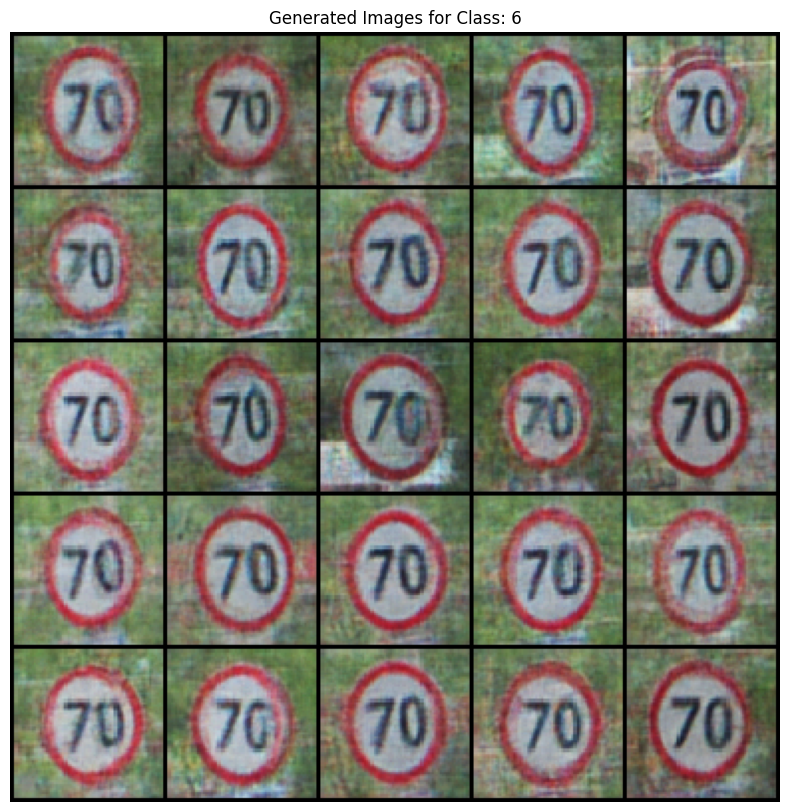

Saved 80 best images for class 6


In [150]:
import os
import torch
from torchvision.utils import save_image, make_grid
from skimage.metrics import structural_similarity as ssim
import numpy as np
from PIL import Image
from torchvision import transforms
import shutil
import matplotlib.pyplot as plt

# Diretorias
original_data_dir = 'data-students/TRAIN'
save_dir = 'data-students/TRAINgenerated3'
balanced_save_dir = 'data-students/TRAIN_balanced'

# Criar diretoria para salvar imagens geradas
os.makedirs(save_dir, exist_ok=True)

# Criar subdiretorias para cada classe
for class_name in traffic_signals_dataset.classes:
    class_dir = os.path.join(save_dir, class_name)
    os.makedirs(class_dir, exist_ok=True)

vae.eval()
num_new_images = 150
top_k = 80  # Número de melhores imagens a serem salvas por classe
max_images_per_class = 80  # Número máximo de imagens por classe
transform = transforms.ToTensor()

def calculate_ssim(img1, img2):
    img1 = img1.squeeze().numpy()
    img2 = img2.squeeze().numpy()
    h, w = img1.shape[:2]
    win_size = min(h, w, 7)  
    if win_size % 2 == 0:
        win_size -= 1 
    return ssim(img1, img2, multichannel=True, win_size=win_size, data_range=1.0, channel_axis=-1)

def generate_images_for_class(class_idx, class_name):
    vae.load_state_dict(torch.load(f'vae_best_{class_name}.pt'))
    vae.eval()

    class_onehot = torch.eye(len(traffic_signals_dataset.classes))[class_idx].to(device)
    class_labels = class_onehot.repeat(num_new_images, 1).to(device)
    z = torch.randn(num_new_images, 64).to(device)

    with torch.no_grad():
        new_imgs = vae.decode(z, class_labels).cpu()

    # Calcular SSIM com imagens reais
    real_images = [img for img, label in traffic_signals_dataset if label == class_idx]
    
    real_images = [img.numpy().transpose(1, 2, 0) for img in real_images]  # Converte de (C, H, W) para (H, W, C)
    real_images = [Image.fromarray((img * 255).astype(np.uint8)) for img in real_images]  # Converter para imagem PIL
    real_images = [transform(img) for img in real_images]  # Converter para tensor
    
    real_images = torch.stack(real_images).to(device)

    ssim_scores = []
    for new_img in new_imgs:
        ssim_score = max([calculate_ssim(new_img, real_img) for real_img in real_images])
        ssim_scores.append(ssim_score)

    # Selecionar as top_k imagens
    top_indices = np.argsort(ssim_scores)[-top_k:]
    top_images = new_imgs[top_indices]

    class_dir = os.path.join(save_dir, class_name)
    for i, img in enumerate(top_images):
        img_path = os.path.join(class_dir, f'{class_name}_{i}.png')
        save_image(img, img_path)

    print(f"Generated {num_new_images} images and saved {top_k} best images for class {class_name}")

   #exibir algumas imagens geradas
    grid_img = make_grid(top_images[:25], nrow=5)
    plt.figure(figsize=(10, 10))
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.title(f'Generated Images for Class: {class_name}')
    plt.axis('off')
    plt.show()

    return top_images

# Gerar imagens para cada classe e salvar apenas as melhores
for class_idx, class_name in enumerate(traffic_signals_dataset.classes):
    print(f"Generating images for class: {class_name}")
    top_images = generate_images_for_class(class_idx, class_name)
    num_saved_images = len(top_images)
    print(f"Saved {num_saved_images} best images for class {class_name}")



# Unir dados de modo a estarem balanceados

In [151]:
# Calcular a distribuição das classes existentes
existing_class_distribution = {}
for _, label in traffic_signals_dataset:
    if label not in existing_class_distribution:
        existing_class_distribution[label] = 0
    existing_class_distribution[label] += 1

print("Existing class distribution:", existing_class_distribution)

max_images_per_class = 80

def balance_classes():
    os.makedirs(balanced_save_dir, exist_ok=True)

    # Criar subdiretórios para cada classe
    for class_name in traffic_signals_dataset.classes:
        class_dir = os.path.join(balanced_save_dir, str(class_name))
        os.makedirs(class_dir, exist_ok=True)

    for class_idx, (class_name, num_existing_images) in enumerate(existing_class_distribution.items()):
        num_additional_images = max_images_per_class - num_existing_images
        if num_additional_images > 0:
            # Copiar imagens originais para a diretoria balanceada
            original_class_dir = os.path.join(original_data_dir, str(traffic_signals_dataset.classes[class_idx])) 
            balanced_class_dir = os.path.join(balanced_save_dir, str(traffic_signals_dataset.classes[class_idx])) 
            print("Original directory:", original_class_dir)  
            print("Balanced directory:", balanced_class_dir) 
            if not os.path.exists(original_class_dir):
                print("Original directory does not exist:", original_class_dir)
            else:
                for img_name in os.listdir(original_class_dir):
                    src_img_path = os.path.join(original_class_dir, img_name)
                    dst_img_path = os.path.join(balanced_class_dir, img_name)
                    shutil.copy(src_img_path, dst_img_path)

            # Gerar e copiar imagens sintéticas adicionais
            # Copiar as melhores imagens geradas
            generated_class_dir = os.path.join(save_dir, str(traffic_signals_dataset.classes[class_idx]))
            generated_images = sorted(os.listdir(generated_class_dir), key=lambda x: int(x.split('_')[-1].split('.')[0]))
            for img_name in generated_images[:num_additional_images]:
                src_img_path = os.path.join(generated_class_dir, img_name)
                dst_img_path = os.path.join(balanced_class_dir, img_name)
                shutil.copy(src_img_path, dst_img_path)
                
        else:
            # Se não são necessárias imagens adicionais, apenas copiar as imagens originais
            original_class_dir = os.path.join(original_data_dir, str(traffic_signals_dataset.classes[class_idx])) 
            balanced_class_dir = os.path.join(balanced_save_dir, str(traffic_signals_dataset.classes[class_idx]))  
            print("Original directory:", original_class_dir)  
            print("Balanced directory:", balanced_class_dir) 

            if not os.path.exists(original_class_dir):
                print("Original directory does not exist:", original_class_dir)
            else:
                for img_name in os.listdir(original_class_dir):
                    src_img_path = os.path.join(original_class_dir, img_name)
                    dst_img_path = os.path.join(balanced_class_dir, img_name)
                    shutil.copy(src_img_path, dst_img_path)
                            
    print("All classes have been balanced.")

balance_classes()


balanced_class_distribution = {}
for class_name in traffic_signals_dataset.classes:
    class_dir = os.path.join(balanced_save_dir, class_name)
    num_images = len(os.listdir(class_dir))
    balanced_class_distribution[class_name] = num_images

print("Balanced class distribution:", balanced_class_distribution)


Existing class distribution: {0: 12, 1: 10, 2: 8, 3: 30, 4: 34, 5: 30, 6: 9, 7: 10, 8: 56, 9: 78}
Original directory: data-students/TRAIN\12
Balanced directory: data-students/TRAIN_balanced\12
Original directory: data-students/TRAIN\13
Balanced directory: data-students/TRAIN_balanced\13
Original directory: data-students/TRAIN\24
Balanced directory: data-students/TRAIN_balanced\24
Original directory: data-students/TRAIN\38
Balanced directory: data-students/TRAIN_balanced\38
Original directory: data-students/TRAIN\39
Balanced directory: data-students/TRAIN_balanced\39
Original directory: data-students/TRAIN\44
Balanced directory: data-students/TRAIN_balanced\44
Original directory: data-students/TRAIN\46
Balanced directory: data-students/TRAIN_balanced\46
Original directory: data-students/TRAIN\49
Balanced directory: data-students/TRAIN_balanced\49
Original directory: data-students/TRAIN\50
Balanced directory: data-students/TRAIN_balanced\50
Original directory: data-students/TRAIN\6
Balan

# RE-treinar a CNN

Training class distribution: {0: 80, 1: 80, 2: 80, 3: 80, 4: 80, 5: 80, 6: 80, 7: 80, 8: 80, 9: 80}
10
cpu
Epoch 1/15, Step 1/21, Loss: 2.4055
Epoch 1/15, Step 2/21, Loss: 2.3115
Epoch 1/15, Step 3/21, Loss: 2.2532
Epoch 1/15, Step 4/21, Loss: 2.3576
Epoch 1/15, Step 5/21, Loss: 2.3377
Epoch 1/15, Step 6/21, Loss: 2.2188
Epoch 1/15, Step 7/21, Loss: 2.2118
Epoch 1/15, Step 8/21, Loss: 2.2097
Epoch 1/15, Step 9/21, Loss: 2.0882
Epoch 1/15, Step 10/21, Loss: 2.1470
Epoch 1/15, Step 11/21, Loss: 2.0306
Epoch 1/15, Step 12/21, Loss: 2.0747
Epoch 1/15, Step 13/21, Loss: 1.8689
Epoch 1/15, Step 14/21, Loss: 1.8969
Epoch 1/15, Step 15/21, Loss: 2.0295
Epoch 1/15, Step 16/21, Loss: 1.9114
Epoch 1/15, Step 17/21, Loss: 1.8367
Epoch 1/15, Step 18/21, Loss: 1.8364
Epoch 1/15, Step 19/21, Loss: 1.7428
Epoch 1/15, Step 20/21, Loss: 1.7815
Epoch 1/15, Step 21/21, Loss: 1.9918
Epoch 1 average loss: 2.0734361750738963
Epoch 2/15, Step 1/21, Loss: 1.5996
Epoch 2/15, Step 2/21, Loss: 1.6192
Epoch 2/15, 

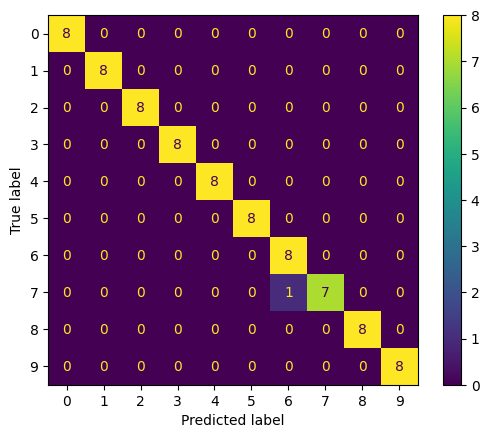

Epoch 1/15, Step 1/21, Loss: 2.3114
Epoch 1/15, Step 2/21, Loss: 2.3180
Epoch 1/15, Step 3/21, Loss: 2.2748
Epoch 1/15, Step 4/21, Loss: 2.2083
Epoch 1/15, Step 5/21, Loss: 2.2034
Epoch 1/15, Step 6/21, Loss: 2.0339
Epoch 1/15, Step 7/21, Loss: 2.1512
Epoch 1/15, Step 8/21, Loss: 2.0988
Epoch 1/15, Step 9/21, Loss: 2.0674
Epoch 1/15, Step 10/21, Loss: 2.0061
Epoch 1/15, Step 11/21, Loss: 1.8796
Epoch 1/15, Step 12/21, Loss: 2.0838
Epoch 1/15, Step 13/21, Loss: 1.9008
Epoch 1/15, Step 14/21, Loss: 1.8483
Epoch 1/15, Step 15/21, Loss: 1.7345
Epoch 1/15, Step 16/21, Loss: 1.8020
Epoch 1/15, Step 17/21, Loss: 1.5815
Epoch 1/15, Step 18/21, Loss: 1.7979
Epoch 1/15, Step 19/21, Loss: 1.7053
Epoch 1/15, Step 20/21, Loss: 1.6111
Epoch 1/15, Step 21/21, Loss: 1.6529
Epoch 1 average loss: 1.965282264209929
Epoch 2/15, Step 1/21, Loss: 1.5105
Epoch 2/15, Step 2/21, Loss: 1.4811
Epoch 2/15, Step 3/21, Loss: 1.4673
Epoch 2/15, Step 4/21, Loss: 1.4306
Epoch 2/15, Step 5/21, Loss: 1.3085
Epoch 2/15, 

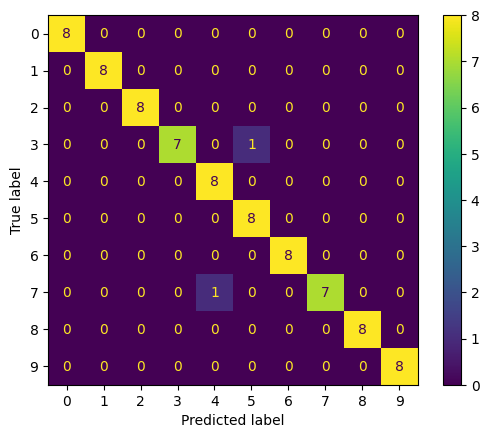

Epoch 1/15, Step 1/21, Loss: 2.4210
Epoch 1/15, Step 2/21, Loss: 2.3181
Epoch 1/15, Step 3/21, Loss: 2.2932
Epoch 1/15, Step 4/21, Loss: 2.2711
Epoch 1/15, Step 5/21, Loss: 2.1720
Epoch 1/15, Step 6/21, Loss: 2.1009
Epoch 1/15, Step 7/21, Loss: 2.1892
Epoch 1/15, Step 8/21, Loss: 2.1311
Epoch 1/15, Step 9/21, Loss: 2.0996
Epoch 1/15, Step 10/21, Loss: 2.1005
Epoch 1/15, Step 11/21, Loss: 1.9469
Epoch 1/15, Step 12/21, Loss: 2.0896
Epoch 1/15, Step 13/21, Loss: 1.9860
Epoch 1/15, Step 14/21, Loss: 1.7004
Epoch 1/15, Step 15/21, Loss: 2.0614
Epoch 1/15, Step 16/21, Loss: 1.8947
Epoch 1/15, Step 17/21, Loss: 1.8194
Epoch 1/15, Step 18/21, Loss: 1.7951
Epoch 1/15, Step 19/21, Loss: 1.8739
Epoch 1/15, Step 20/21, Loss: 1.6066
Epoch 1/15, Step 21/21, Loss: 1.6557
Epoch 1 average loss: 2.0250640312830606
Epoch 2/15, Step 1/21, Loss: 1.8255
Epoch 2/15, Step 2/21, Loss: 1.4206
Epoch 2/15, Step 3/21, Loss: 1.6645
Epoch 2/15, Step 4/21, Loss: 1.4250
Epoch 2/15, Step 5/21, Loss: 1.4617
Epoch 2/15,

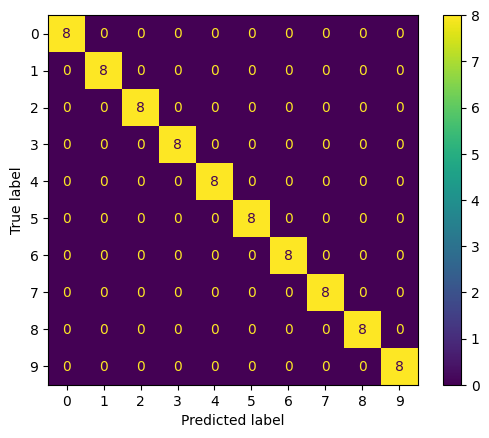

Médias das precisões: [1.         1.         1.         1.         0.96296296 0.96296296
 0.96296296 1.         1.         1.        ]
Médias dos recalls: [1.         1.         1.         0.95833333 1.         1.
 1.         0.91666667 1.         1.        ]


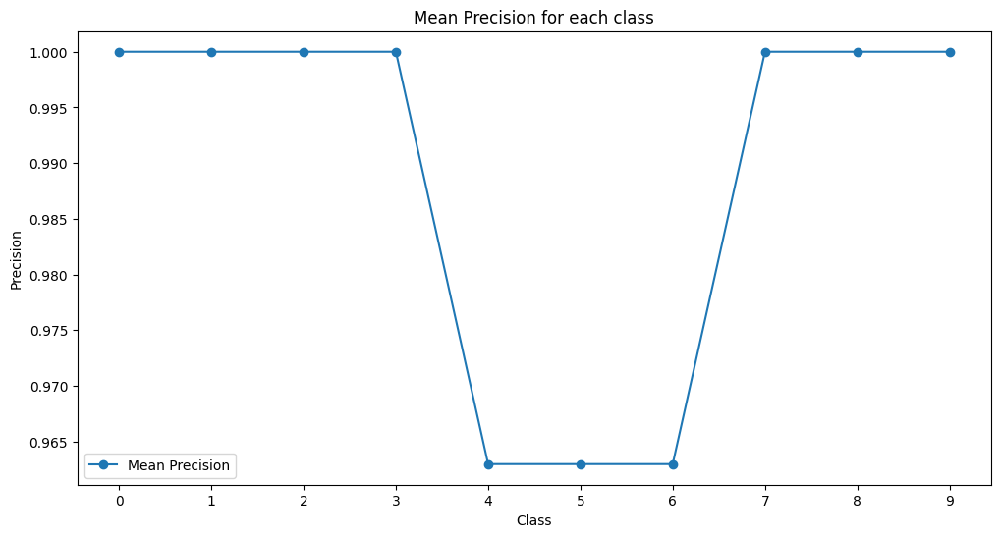

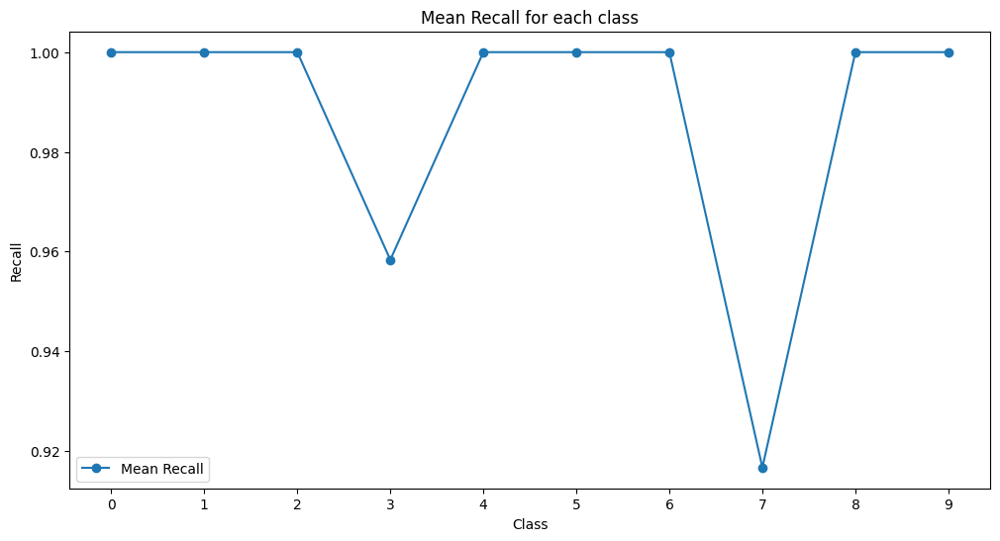

In [23]:
import matplotlib.pyplot as plt
import os
import re
from PIL import Image
from skimage.io import imread, imshow
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, precision_recall_fscore_support
import numpy as np

train_dataset_path = 'data-students/TRAIN/'
test_dataset_path = 'data-students/TEST'
balanced_dataset_path = 'data-students/TRAIN_balanced'

IMG_WIDTH = 75
IMG_HEIGHT = 75
BATCH_SIZE = 32


transform = transforms.Compose([transforms.Resize((IMG_WIDTH, IMG_HEIGHT)), transforms.ToTensor()])
traffic_signals_dataset = datasets.ImageFolder(root=balanced_dataset_path, transform=transform)

# Divisão dos dados em treino, validação e teste (10% para validação, 10% para teste)
train_val_idx, test_idx = train_test_split(
    range(len(traffic_signals_dataset)),
    test_size=0.1,
    shuffle=True,
    stratify=traffic_signals_dataset.targets
)

train_idx, valid_idx = train_test_split(
    train_val_idx,
    test_size=0.1,
    shuffle=True,
    stratify=[traffic_signals_dataset.targets[i] for i in train_val_idx]
)

train_subset = Subset(traffic_signals_dataset, train_idx)
valid_subset = Subset(traffic_signals_dataset, valid_idx)
test_subset = Subset(traffic_signals_dataset, test_idx)

train_dataset_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True)
validation_dataset_loader = DataLoader(valid_subset, batch_size=BATCH_SIZE, shuffle=False)
testtrain_dataset_loader = DataLoader(test_subset, batch_size=BATCH_SIZE, shuffle=False)
validation_dataset_loader = DataLoader(valid_subset, batch_size=64, shuffle=False)

training_targets = traffic_signals_dataset.targets
t_targets = {k: 0 for k in training_targets}
for t in training_targets:
    t_targets[t] += 1
print('Training class distribution:', t_targets)

class TestDataset(Dataset):
    def get_int(self, text):
        return [int(c) if c.isdigit() else c for c in re.split('(\d+)', text)]
    
    def __init__(self, images_folder, transform=None):
        self.images_folder = images_folder
        self.image_files = [f for f in os.listdir(images_folder) if os.path.isfile(os.path.join(images_folder, f))]
        self.image_files.sort(key=self.get_int)
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.images_folder, self.image_files[idx])
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

inference_dataset = TestDataset(images_folder=test_dataset_path, transform=transform)
test_dataset_loader = DataLoader(inference_dataset, batch_size=BATCH_SIZE, shuffle=False)

class CustomCNN(nn.Module):
    def __init__(self, img_width, img_height, num_classes):
        super(CustomCNN, self).__init__()
        
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=128, kernel_size=5, padding='valid')
        self.bn1 = nn.BatchNorm2d(num_features=128)
        
        self.conv2 = nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding='valid', bias=False)
        self.bn2 = nn.BatchNorm2d(num_features=64)
        
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=32, kernel_size=3, padding='valid', bias=False)
        self.bn3 = nn.BatchNorm2d(num_features=32)
        
        self.fc1 = nn.Linear(1568, 256)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(256, num_classes)
        
    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.max_pool2d(x, kernel_size=2)
        
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.max_pool2d(x, kernel_size=2)
        
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.max_pool2d(x, kernel_size=2)
        
        x = torch.flatten(x, 1)  # Flatten all dimensions except batch
        
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        
        return x
    
    def train_model(model, criterion, optimizer, train_dataset_loader, num_epochs=10, device='cpu'):
        model.to(device)
        for epoch in range(num_epochs):
            cumulative_loss = 0
            for batch_idx, (data, target) in enumerate(train_dataset_loader):
                data, target = data.to(device), target.to(device)
                optimizer.zero_grad()
                output = model(data)
                loss = criterion(output, target)
                loss.backward()
                optimizer.step()

                print(f'Epoch {epoch+1}/{num_epochs}, Step {batch_idx+1}/{len(train_dataset_loader)}, Loss: {loss.item():.4f}')
                cumulative_loss += loss.item()
            print(f"Epoch {epoch+1} average loss: {cumulative_loss/len(train_dataset_loader)}")
        return model.to("cpu")

device = torch.device("cpu")
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")

num_classes = len(traffic_signals_dataset.classes)
print(num_classes)
print(device)


def train_and_evaluate():
    # Divisão dos dados em treino, validação e teste (10% para validação, 10% para teste)
    train_val_idx, test_idx = train_test_split(
        range(len(traffic_signals_dataset)),
        test_size=0.1,
        shuffle=True,
        stratify=traffic_signals_dataset.targets
    )

    train_idx, valid_idx = train_test_split(
        train_val_idx,
        test_size=0.1,
        shuffle=True,
        stratify=[traffic_signals_dataset.targets[i] for i in train_val_idx]
    )

    train_subset = Subset(traffic_signals_dataset, train_idx)
    valid_subset = Subset(traffic_signals_dataset, valid_idx)
    test_subset = Subset(traffic_signals_dataset, test_idx)

    train_dataset_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True)
    validation_dataset_loader = DataLoader(valid_subset, batch_size=BATCH_SIZE, shuffle=False)
    test_dataset_loader = DataLoader(test_subset, batch_size=BATCH_SIZE, shuffle=False)

    # Treinamento do modelo
    model = CustomCNN(IMG_WIDTH, IMG_HEIGHT, num_classes)
    criterion = nn.CrossEntropyLoss()  
    optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    num_epochs = 15

    ccnn = CustomCNN.train_model(model, criterion, optimizer, train_dataset_loader, num_epochs, device)

    return test_model(ccnn, test_dataset_loader)

# Avaliação do modelo
def test_model(model, dataset_loader):
    y_real = []
    y_pred = []
    model.to(device)
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        for images, labels in dataset_loader:
            y_real.extend(labels.numpy())
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            y_pred.extend(predicted.cpu().numpy())
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the {} test images: {} %'.format(total, 100 * correct / total))
    
    # Generate the classification report
    report = classification_report(y_real, y_pred, output_dict=True)
    cm = confusion_matrix(y_real, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot()
    plt.show()
    
    # Extract precision and recall for each class
    precisions = []
    recalls = []
    for i in range(num_classes):
        precisions.append(report[str(i)]['precision'])
        recalls.append(report[str(i)]['recall'])

    return precisions, recalls

# Executar o treinamento e avaliação 3 vezes
all_precisions = []
all_recalls = []

for i in range(3):
    precisions, recalls = train_and_evaluate()
    all_precisions.append(precisions)
    all_recalls.append(recalls)

# Calcular as médias de precisão e recall
mean_precisions = np.mean(all_precisions, axis=0)
mean_recalls = np.mean(all_recalls, axis=0)

print("Médias das precisões:", mean_precisions)
print("Médias dos recalls:", mean_recalls)

# Plotting Precision and Recall for each class
classes = list(range(num_classes))

# Primeiro gráfico: Precision para cada classe
plt.figure(figsize=(12, 6))
plt.plot(classes, mean_precisions, marker='o', label='Mean Precision')
plt.xlabel('Class')
plt.ylabel('Precision')
plt.title('Mean Precision for each class')
plt.xticks(classes)
plt.legend()
plt.show()

# Segundo gráfico: Recall para cada classe
plt.figure(figsize=(12, 6))
plt.plot(classes, mean_recalls, marker='o', label='Mean Recall')
plt.xlabel('Class')
plt.ylabel('Recall')
plt.title('Mean Recall for each class')
plt.xticks(classes)
plt.legend()
plt.show()

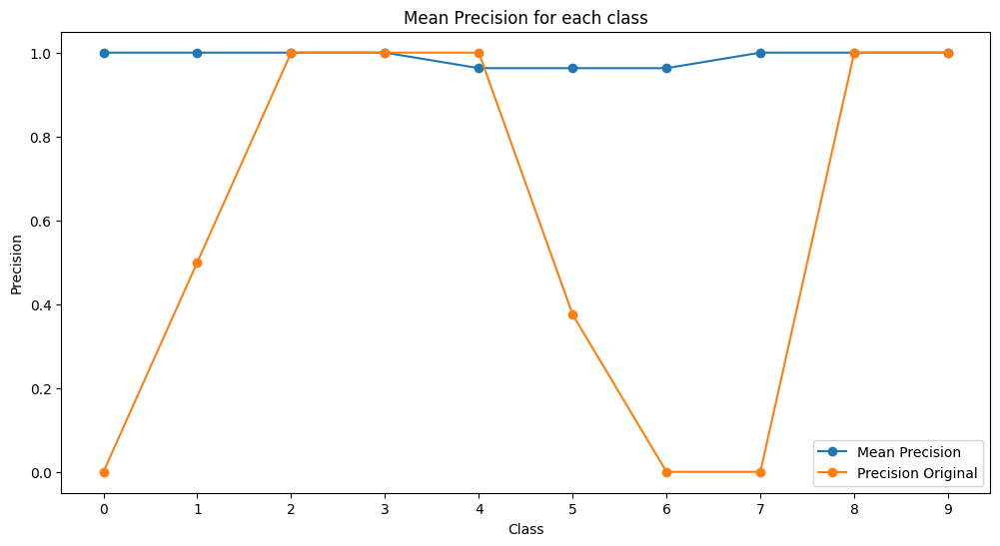

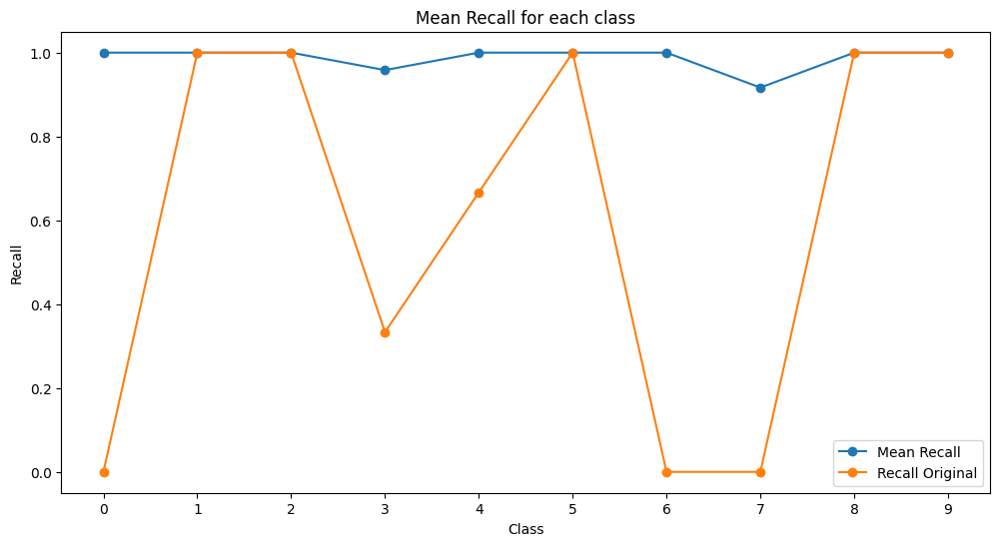

In [24]:
# Primeiro gráfico: Precision para cada classe
plt.figure(figsize=(12, 6))
plt.plot(classes, mean_precisions, marker='o', label='Mean Precision')
plt.plot(classes,precisions_original, marker='o', label='Precision Original')
plt.xlabel('Class')
plt.ylabel('Precision')
plt.title('Mean Precision for each class')
plt.xticks(classes)
plt.legend()
plt.show()

# Segundo gráfico: Recall para cada classe
plt.figure(figsize=(12, 6))
plt.plot(classes, mean_recalls, marker='o', label='Mean Recall')
plt.plot(classes,recalls_original, marker='o', label='Recall Original')
plt.xlabel('Class')
plt.ylabel('Recall')
plt.title('Mean Recall for each class')
plt.xticks(classes)
plt.legend()
plt.show()


# Calcular FID

FID Score for class 12: 622.50830078125
FID Score for class 13: 1532.8447265625
FID Score for class 24: 1342.63037109375
FID Score for class 38: 454.1147155761719
FID Score for class 39: 458.99609375
FID Score for class 44: 209.98370361328125
FID Score for class 46: 380.8551330566406
FID Score for class 49: 455.279052734375
FID Score for class 50: 214.1434326171875
FID Score for class 6: 709.1829223632812


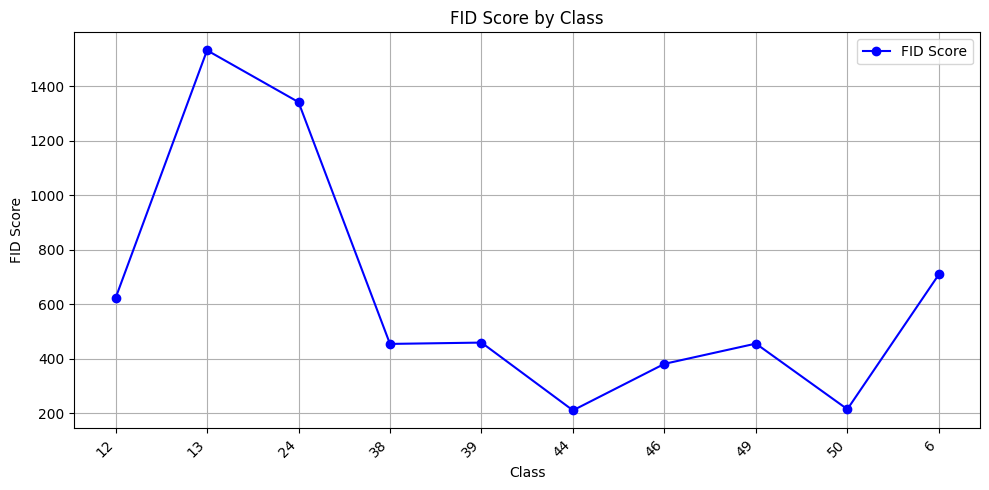

In [240]:
import torch
import torchvision.transforms as transforms
from torchvision.models import inception_v3
import os
from PIL import Image
from scipy.linalg import sqrtm
import numpy as np
import matplotlib.pyplot as plt

IMG_WIDTH = 75
IMG_HEIGHT = 75

transform = transforms.Compose([
    transforms.Resize((IMG_WIDTH, IMG_HEIGHT)),  # Resize to the expected input size of InceptionV3
    transforms.Lambda(lambda img: img.convert('RGB')),
    transforms.ToTensor(),  # Convert PIL image back to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

aumentadas_path = 'data-students/TRAINgenerated3'
train_dataset_path = 'data-students/TRAIN'

# Initialize InceptionV3 model
model = inception_v3(pretrained=True, transform_input=False)
model.eval()

def calculate_fid(model, images1, images2):
    # Ensure the model is in evaluation mode
    model.eval()

    # Forward pass through the model
    with torch.no_grad():
        features1 = model(images1).detach()
        features2 = model(images2).detach()

    # Flatten the features
    features1 = features1.view(features1.size(0), -1)
    features2 = features2.view(features2.size(0), -1)

    # Compute the mean and covariance across the feature dimension
    mu1, sigma1 = features1.mean(dim=0), torch.cov(features1.T)
    mu2, sigma2 = features2.mean(dim=0), torch.cov(features2.T)

    # Calculate sum squared difference between means
    ssdiff = torch.sum((mu1 - mu2) ** 2)

    # Calculate sqrt of product between covariances
    covmean, _ = sqrtm(sigma1 @ sigma2, disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = ssdiff + torch.trace(sigma1 + sigma2 - 2.0 * torch.tensor(covmean, dtype=torch.float32))
    return fid.item()

# Function to load images for a class
def load_images_for_class(path, transform):
    images = []
    for img_name in os.listdir(path):
        if not img_name.startswith('.'):
            img_path = os.path.join(path, img_name)
            try:
                img = Image.open(img_path)
                img_tensor = transform(img).unsqueeze(0)
                images.append(img_tensor)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
    return torch.cat(images)

# Calculate FID for each class
fid_scores = []
classes = sorted([class_name for class_name in os.listdir(train_dataset_path) if not class_name.startswith('.')])

for class_idx, class_name in enumerate(classes):
    class_path_train = os.path.join(train_dataset_path, class_name)
    class_path_augmented = os.path.join(aumentadas_path, class_name)

    # Load images for the current class from both datasets
    images1 = load_images_for_class(class_path_train, transform)
    images2 = load_images_for_class(class_path_augmented, transform)

    if len(images1) == 0 or len(images2) == 0:
        print(f"Skipping class {class_name} due to lack of images.")
        continue

    # Calculate the FID score for the current class
    fid_score = calculate_fid(model, images1, images2)
    fid_scores.append(fid_score)
    print(f"FID Score for class {class_name}: {fid_score}")

# Plot FID scores by class
plt.figure(figsize=(10, 5))
plt.plot(classes, fid_scores, marker='o', color='blue', label='FID Score')
plt.xlabel('Class')
plt.ylabel('FID Score')
plt.title('FID Score by Class')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



Calcular SSIM

Average SSIM for class 12: 0.10624593496322632
Average SSIM for class 13: 0.20388762652873993
Average SSIM for class 24: 0.3157119154930115
Average SSIM for class 38: 0.04581809416413307
Average SSIM for class 39: 0.22043615579605103
Average SSIM for class 44: 0.23234286904335022
Average SSIM for class 46: 0.27402541041374207
Average SSIM for class 49: 0.23889485001564026
Average SSIM for class 50: 0.21435435116291046
Average SSIM for class 6: 0.12514628469944


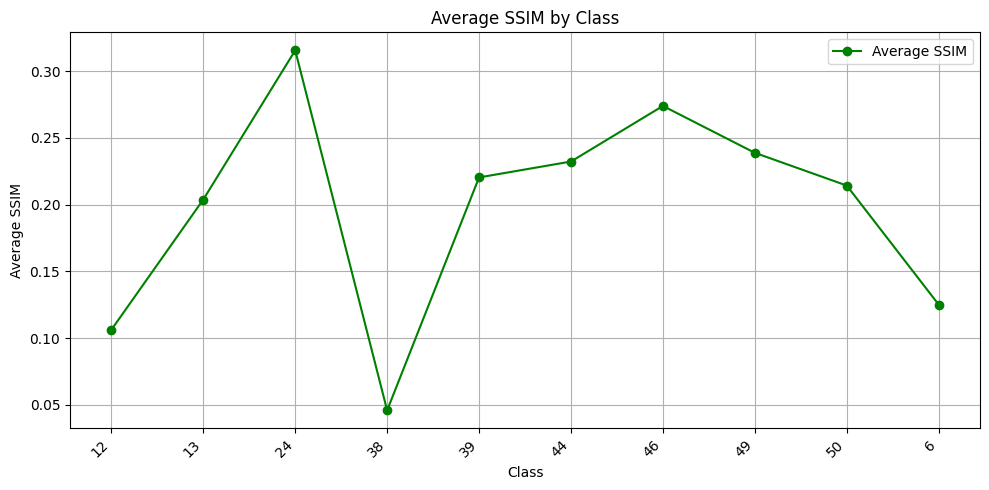

In [239]:
import os
import torch
import torchvision.transforms as transforms
from PIL import Image
from skimage.metrics import structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

IMG_WIDTH = 75
IMG_HEIGHT = 75

transform = transforms.Compose([
    transforms.Resize((IMG_WIDTH, IMG_HEIGHT)),  # Resize to the expected input size of InceptionV3
    transforms.Lambda(lambda img: img.convert('RGB')),
    transforms.ToTensor(),  # Convert PIL image back to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

aumentadas_path = 'data-students/TRAINgenerated3'
train_dataset_path = 'data-students/TRAIN'

def calculate_ssim(img1, img2):
    img1 = img1.squeeze().numpy()  
    img2 = img2.squeeze().numpy()  
    h, w = img1.shape[:2]
    win_size = min(h, w, 7)  
    if win_size % 2 == 0:
        win_size -= 1  # Torna o tamanho da janela ímpar
    return ssim(img1, img2, multichannel=True, win_size=win_size, data_range=1.0, channel_axis=-1)

def load_images_for_class(path, transform):
    images = []
    for img_name in os.listdir(path):
        if not img_name.startswith('.'):  # Ignorar ficheiros que começam com "."
            img_path = os.path.join(path, img_name)
            try:
                img = Image.open(img_path)
                img_tensor = transform(img).unsqueeze(0)
                images.append(img_tensor)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
    return torch.cat(images)

ssim_scores = []
classes = sorted([class_name for class_name in os.listdir(train_dataset_path) if not class_name.startswith('.')])

for class_idx, class_name in enumerate(classes):
    class_path_train = os.path.join(train_dataset_path, class_name)
    class_path_augmented = os.path.join(aumentadas_path, class_name)

    # Load images for the current class from both datasets
    images1 = load_images_for_class(class_path_train, transform)
    images2 = load_images_for_class(class_path_augmented, transform)

    if len(images1) == 0 or len(images2) == 0:
        print(f"Skipping class {class_name} due to lack of images.")
        continue

    # Calculate SSIM score for each pair of images
    class_ssim_scores = []
    for img1, img2 in zip(images1, images2):
        ssim_score = calculate_ssim(img1.squeeze(), img2.squeeze())
        class_ssim_scores.append(ssim_score)

    # Average SSIM score for the current class
    average_ssim = np.mean(class_ssim_scores)
    ssim_scores.append(average_ssim)
    print(f"Average SSIM for class {class_name}: {average_ssim}")

# Plot SSIM scores by class
plt.figure(figsize=(10, 5))
plt.plot(classes, ssim_scores, marker='o', color='green', label='Average SSIM')
plt.xlabel('Class')
plt.ylabel('Average SSIM')
plt.title('Average SSIM by Class')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

